https://mne.tools/dev/auto_examples/preprocessing/muscle_detection.html

Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
Raw data loaded. Number of channels: 127, Sampling frequency: 128.0 Hz
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Selected EEG channels: ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
Standard 10-20 montage applied.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Applied average reference and band-pass filter (1 - 40 Hz).
Fitting ICA to data using 32 channels (please be patient, this may take a while)
Selecting by number: 5 components
Fitting ICA took 1.5s.


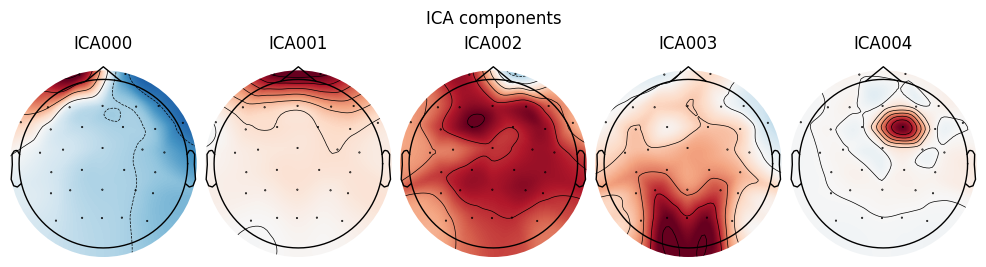

ICA applied to remove artifacts.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
EOG regression applied.
Applying ICA to Raw instance
    Transforming to ICA space (5 components)
    Zeroing out 0 ICA components
    Projecting back using 32 PCA components
ICA solution applied to obtain cleaned data.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 63 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 63.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 63.50 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Setting up low-pass filter at 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 213 samples (1.664 s)

Muscle artifacts annotated with z-score threshold=5.
Using matplotlib as 2D backend.


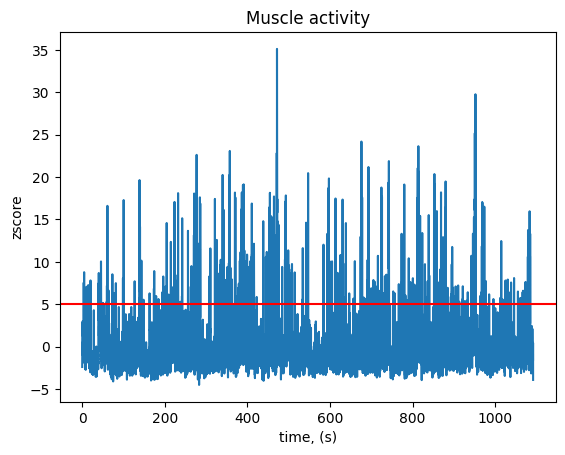

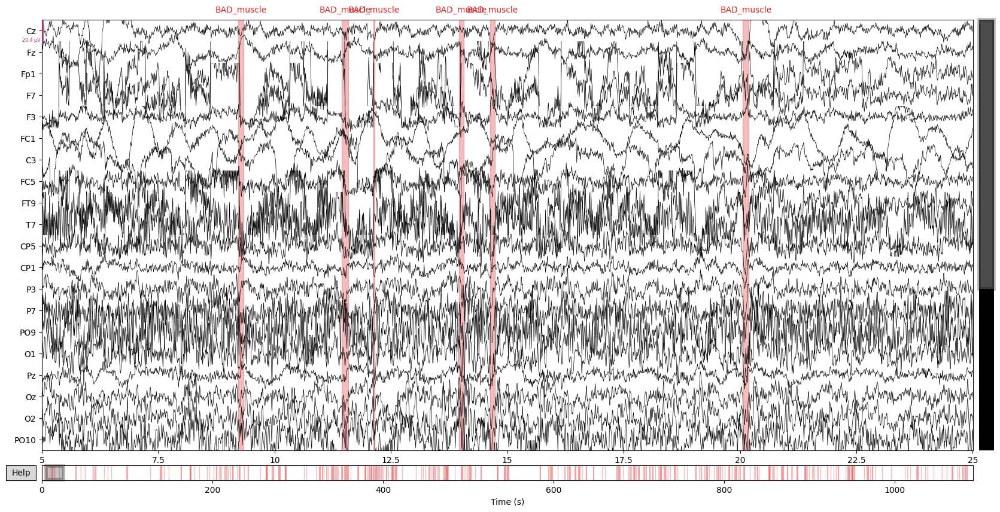

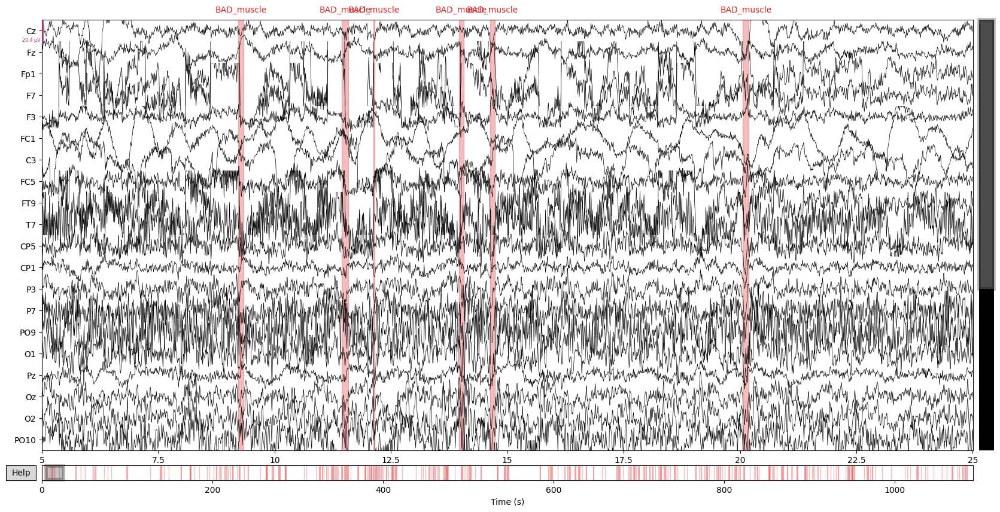

Plotted raw and cleaned EEG data with muscle artifact annotations.


In [1]:
import mne
from mne.preprocessing import ICA, EOGRegression, annotate_muscle_zscore
import numpy as np
import matplotlib.pyplot as plt

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', preload=True, verbose=True, infer_types=True)
print(f"Raw data loaded. Number of channels: {len(raw.ch_names)}, Sampling frequency: {raw.info['sfreq']} Hz")

# Select EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
raw.pick_channels(eeg_channels)
print(f"Selected EEG channels: {eeg_channels}")

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
print("Standard 10-20 montage applied.")

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)
raw.filter(l_freq=1, h_freq=40)
print("Applied average reference and band-pass filter (1 - 40 Hz).")

# Apply ICA to remove artifacts
ica = ICA(n_components=5, random_state=97, max_iter=800)
ica.fit(raw)
ica.plot_components()
print("ICA applied to remove artifacts.")

# EOG regression
eogRegression = EOGRegression(picks_artifact='Fp1')
eogRegression.fit(raw)
eogCorrected = eogRegression.apply(raw.copy())
print("EOG regression applied.")

# Apply ICA solution to clean data
raw_clean = ica.apply(raw.copy())
print("ICA solution applied to obtain cleaned data.")

# Annotate muscle artifacts using z-score
threshold_muscle = 5  # z-score
annot_muscle, scores_muscle = annotate_muscle_zscore(
    raw,
    ch_type="eeg",
    threshold=threshold_muscle,
    min_length_good=0.2,
    filter_freq=[1, 63],
)

fig, ax = plt.subplots()
ax.plot(raw.times, scores_muscle)
ax.axhline(y=threshold_muscle, color="r")
ax.set(xlabel="time, (s)", ylabel="zscore", title="Muscle activity")

# Convert segments to Annotations format
if annot_muscle is not None:
    annot_onset = annot_muscle.onset
    annot_duration = annot_muscle.duration
    annot_description = annot_muscle.description
    annot = mne.Annotations(annot_onset, annot_duration, annot_description, orig_time=raw.annotations.orig_time)
    raw.set_annotations(annot)
    raw_clean.set_annotations(annot)  # Apply the same annotations to cleaned data

    print(f"Muscle artifacts annotated with z-score threshold={threshold_muscle}.")

# Plot raw and cleaned data with annotations
# Example: Assuming raw and order are defined correctly
order = np.arange(0, len(raw.ch_names))  # Replace with your valid channel indices
raw.plot(start=5, duration=20, order=order, title='Raw EEG Data with Muscle Annotations', scalings='auto', show=True, block=True)
raw_clean.plot(start=5, duration=20, order=order, title='Cleaned EEG Data with Muscle Annotations', scalings='auto', show=True, block=True)

print("Plotted raw and cleaned EEG data with muscle artifact annotations.")

Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
Raw data loaded. Number of channels: 127, Sampling frequency: 128.0 Hz
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Selected EEG channels: ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
Standard 10-20 montage applied.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 5 components
Fitting ICA took 1.8s.


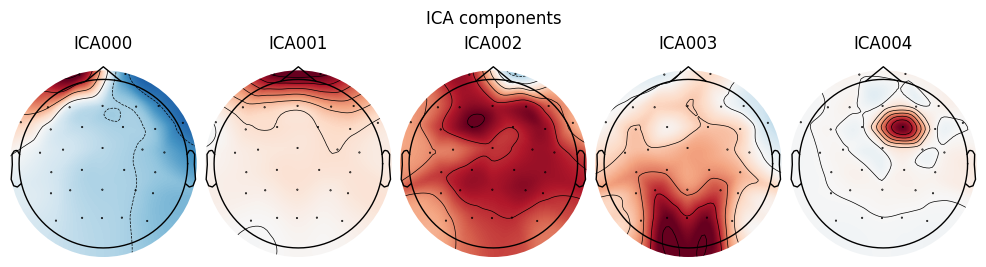

ICA applied to remove artifacts.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
EOG regression applied.
Applying ICA to Raw instance
    Transforming to ICA space (5 components)
    Zeroing out 0 ICA components
    Projecting back using 32 PCA components
ICA solution applied to obtain cleaned data.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 63 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 63.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 63.50 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Setting up low-pass filter at 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 213 samples (1.664 s)

Muscle artifacts annotated with z-score threshold=5.
Used Annotations descriptions: ['BAD_muscle']


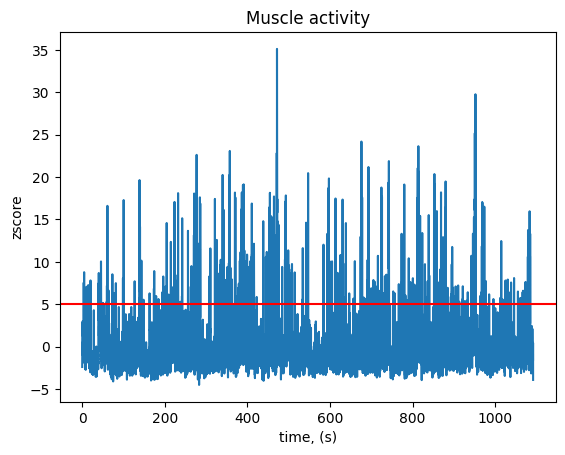

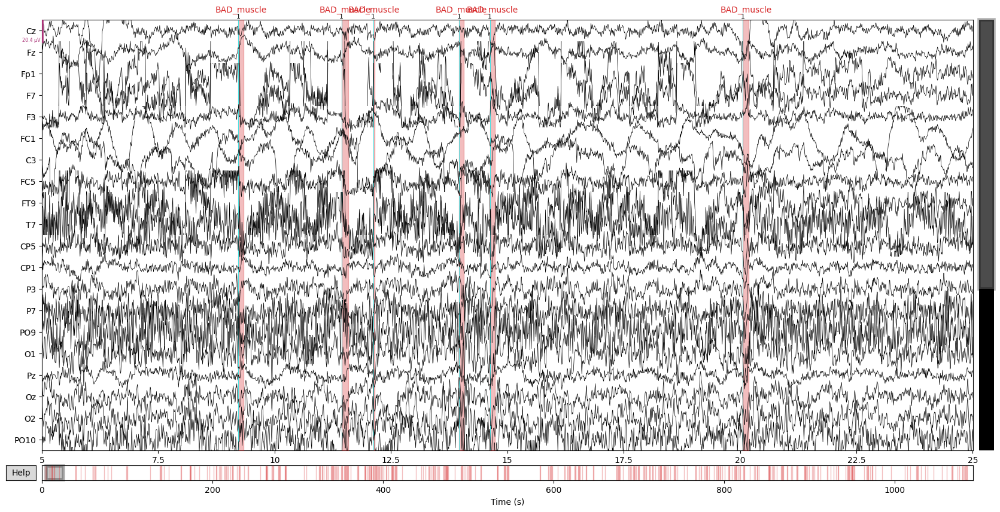

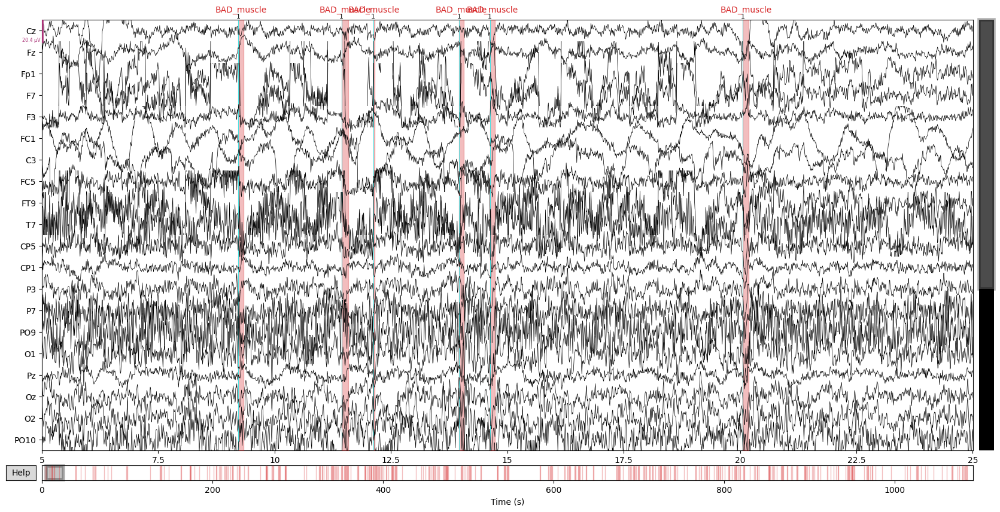

Plotted raw and cleaned EEG data with annotations and events.


In [7]:
import mne
from mne.preprocessing import ICA, EOGRegression, annotate_muscle_zscore
import numpy as np
import matplotlib.pyplot as plt

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', preload=True, verbose=True, infer_types=True)
print(f"Raw data loaded. Number of channels: {len(raw.ch_names)}, Sampling frequency: {raw.info['sfreq']} Hz")

# Select EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
raw.pick_channels(eeg_channels)
print(f"Selected EEG channels: {eeg_channels}")

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
print("Standard 10-20 montage applied.")

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)
raw.filter(l_freq=1, h_freq=40)
print("Applied average reference and band-pass filter (1 - 40 Hz).")

# Apply ICA to remove artifacts
ica = ICA(n_components=5, random_state=97, max_iter=800)
ica.fit(raw)
ica.plot_components()
print("ICA applied to remove artifacts.")

# EOG regression
eogRegression = EOGRegression(picks_artifact='Fp1')
eogRegression.fit(raw)
eogCorrected = eogRegression.apply(raw.copy())
print("EOG regression applied.")

# Apply ICA solution to clean data
raw_clean = ica.apply(raw.copy())
print("ICA solution applied to obtain cleaned data.")

# Annotate muscle artifacts using z-score
threshold_muscle = 5  # z-score
annot_muscle, scores_muscle = annotate_muscle_zscore(
    raw,
    ch_type="eeg",
    threshold=threshold_muscle,
    min_length_good=0.2,
    filter_freq=[1, 63],
)

fig, ax = plt.subplots()
ax.plot(raw.times, scores_muscle)
ax.axhline(y=threshold_muscle, color="r")
ax.set(xlabel="time, (s)", ylabel="zscore", title="Muscle activity")

# Convert segments to Annotations format
if annot_muscle is not None:
    annot_onset = annot_muscle.onset
    annot_duration = annot_muscle.duration
    annot_description = annot_muscle.description
    annot = mne.Annotations(annot_onset, annot_duration, annot_description, orig_time=raw.annotations.orig_time)
    raw.set_annotations(annot)
    raw_clean.set_annotations(annot)  # Apply the same annotations to cleaned data

    print(f"Muscle artifacts annotated with z-score threshold={threshold_muscle}.")

# Extract events from annotations (if available)
events_from_annot, event_dict = mne.events_from_annotations(raw, event_id=None, regexp=None, use_rounding=False)

# Plot raw and cleaned data with annotations and events
order = np.arange(0, len(raw.ch_names))  # Replace with your valid channel indices
raw.plot(start=5, duration=20, order=order, title='Raw EEG Data with Annotations', scalings='auto', events=events_from_annot)
raw_clean.plot(start=5,duration=20, order=order, title='Cleaned EEG Data with Annotations', scalings='auto', events=events_from_annot)

plt.show()

print("Plotted raw and cleaned EEG data with annotations and events.")


Finds bad channels

Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\103918\103918.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwid

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 32 components
Fitting ICA took 7.0s.


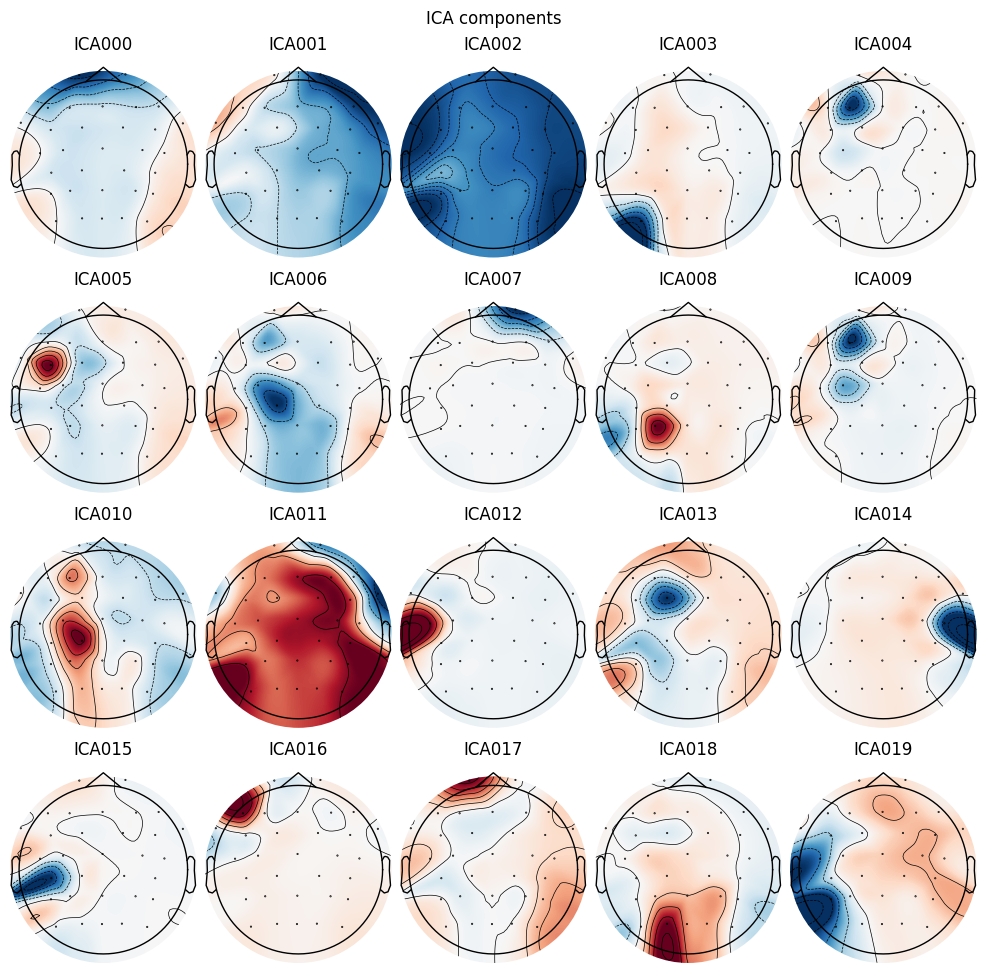

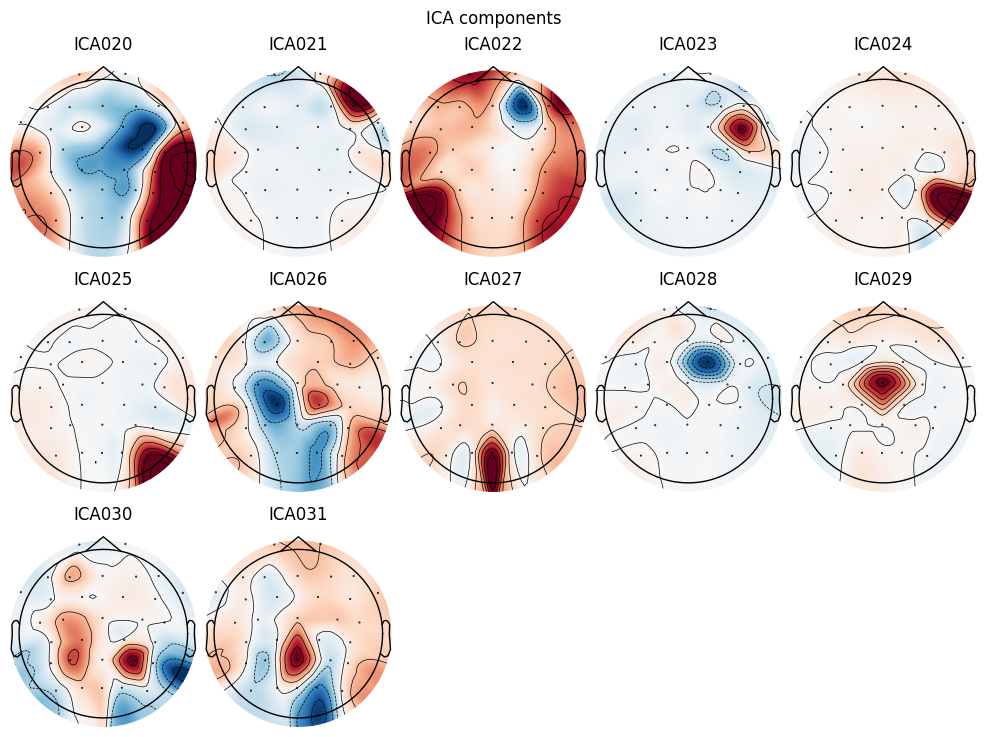

Using EOG channel: Fp1
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


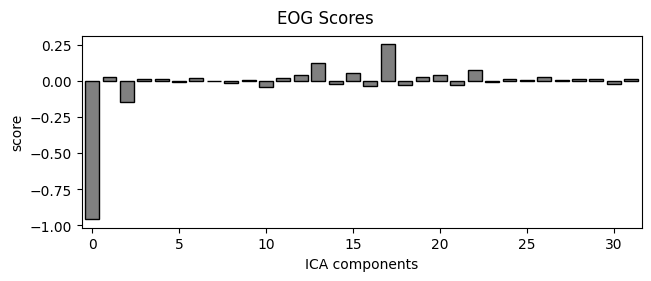

Effective window size : 16.000 (s)


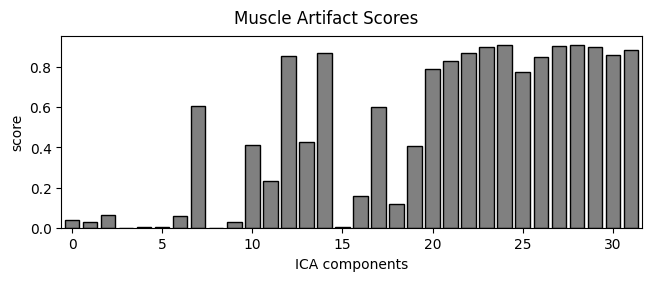

Applying ICA to Raw instance
    Transforming to ICA space (32 components)
    Zeroing out 22 ICA components
    Projecting back using 32 PCA components
Raw file


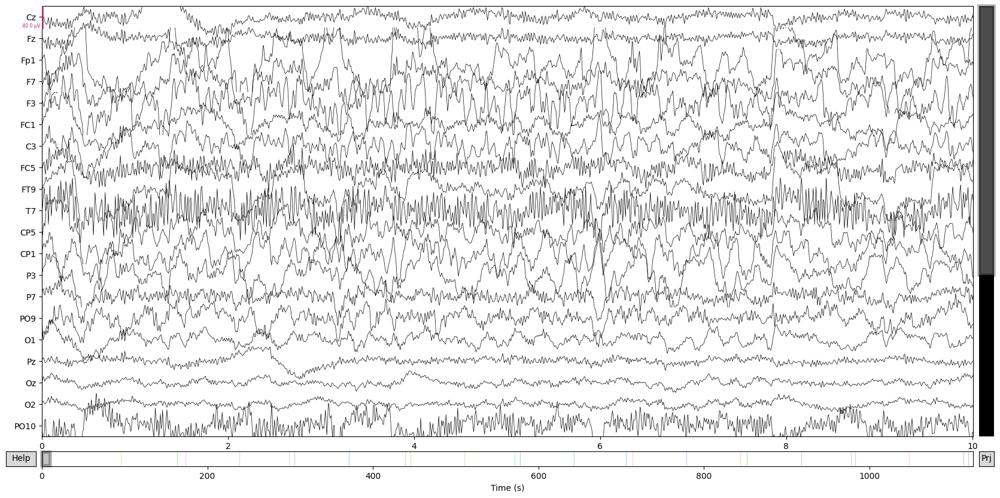

Cleaned file


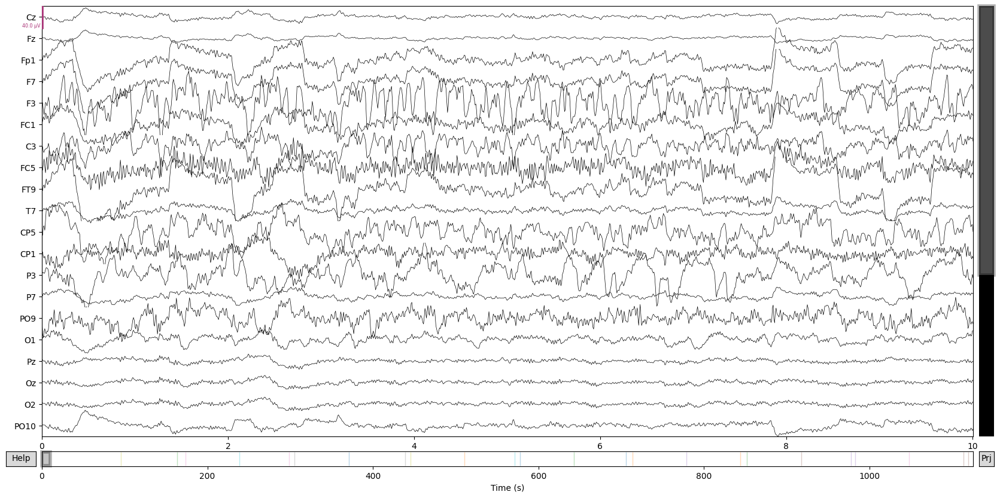

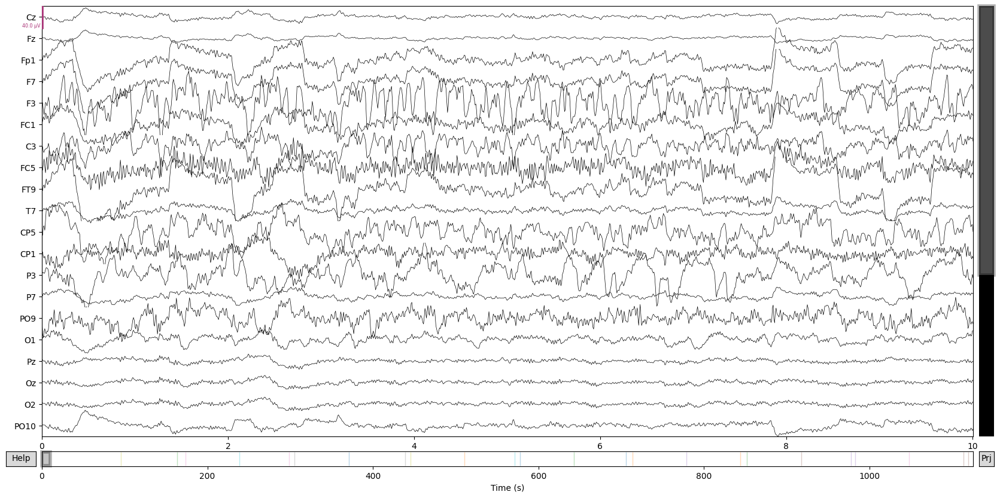

In [2]:
import mne
from mne.preprocessing import ICA

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\103918\103918.edf', preload=True, verbose=True, infer_types=True)
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Select only EEG channels
raw.pick_channels(eeg_channels)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference #, projection=True
raw.filter(l_freq=1, h_freq=40)  # Apply band-pass filter

# Extract events from annotations
events_from_annot, event_dict = mne.events_from_annotations(raw)

# Set up ICA
ica = ICA(n_components=32, random_state=97, max_iter=800)

# Fit ICA on the raw EEG data
ica.fit(raw)

# Plot ICA components to manually inspect and identify components
ica.plot_components()

# Use built-in methods to automatically find EOG-like components
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name='Fp1')  # assuming Fp1 is most likely to capture eye blinks
ica.plot_scores(eog_scores, title='EOG Scores')

# Use built-in methods to automatically find muscle artifact components
muscle_noise_indices, muscle_noise_scores = ica.find_bads_muscle(raw)
ica.plot_scores(muscle_noise_scores, title='Muscle Artifact Scores')

# Combine the indices of bad components
ica.exclude = list(set(eog_indices + muscle_noise_indices))

# Apply the ICA solution to the raw data to remove the artifacts
raw_clean = ica.apply(raw.copy())

# Plot the raw and cleaned data for comparison using MNE's plotting functions
print('Raw file')
mne.viz.plot_raw(raw, events=events_from_annot, event_color={1: 'r'}, title='Raw EEG Data')
print('Cleaned file')
mne.viz.plot_raw(raw_clean, events=events_from_annot, event_color={1: 'r'}, title='Cleaned EEG Data',block=True)

## TRY to combine events and muscle

In [ ]:
import mne
from mne.preprocessing import ICA, EOGRegression, annotate_muscle_zscore
import numpy as np
import matplotlib.pyplot as plt

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', preload=True, verbose=True, infer_types=True)
print(f"Raw data loaded. Number of channels: {len(raw.ch_names)}, Sampling frequency: {raw.info['sfreq']} Hz")

# Select EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
raw.pick_channels(eeg_channels)
print(f"Selected EEG channels: {eeg_channels}")

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
print("Standard 10-20 montage applied.")

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)
raw.filter(l_freq=1, h_freq=40)
print("Applied average reference and band-pass filter (1 - 40 Hz).")

# Apply ICA to remove artifacts
ica = ICA(n_components=5, random_state=97, max_iter=800)
ica.fit(raw)
ica.plot_components()
print("ICA applied to remove artifacts.")

# EOG regression
eogRegression = EOGRegression(picks_artifact='Fp1')
eogRegression.fit(raw)
eogCorrected = eogRegression.apply(raw.copy())
print("EOG regression applied.")

# Apply ICA solution to clean data
raw_clean = ica.apply(raw.copy())
print("ICA solution applied to obtain cleaned data.")

# Annotate muscle artifacts using z-score
threshold_muscle = 5  # z-score
annot_muscle, scores_muscle = annotate_muscle_zscore(
    raw,
    ch_type="eeg",
    threshold=threshold_muscle,
    min_length_good=0.2,
    filter_freq=[1, 63],
)

fig, ax = plt.subplots()
ax.plot(raw.times, scores_muscle)
ax.axhline(y=threshold_muscle, color="r")
ax.set(xlabel="time, (s)", ylabel="zscore", title="Muscle activity")

# Convert segments to Annotations format
if annot_muscle is not None:
    annot_onset = annot_muscle.onset
    annot_duration = annot_muscle.duration
    annot_description = annot_muscle.description
    annot_muscle_combined = mne.Annotations(annot_onset, annot_duration, annot_description, orig_time=raw.annotations.orig_time)
    raw.set_annotations(annot_muscle_combined)
    raw_clean.set_annotations(annot_muscle_combined)  # Apply the same annotations to cleaned data

    print(f"Muscle artifacts annotated with z-score threshold={threshold_muscle}.")

# Extract events from annotations (if available)
events_regular, _ = mne.events_from_annotations(raw, event_id=None, regexp=None, use_rounding=False)
events_muscle, _ = mne.events_from_annotations(raw, event_id=None, regexp='Muscle artifact')  # Assuming a specific regexp for muscle artifacts

# Combine events
if events_regular is not None and events_muscle is not None:
    events_combined = np.concatenate((events_regular, events_muscle), axis=0)
elif events_regular is not None:
    events_combined = events_regular
elif events_muscle is not None:
    events_combined = events_muscle
else:
    events_combined = None

# Plot raw and cleaned data with combined events
order = np.arange(0, len(raw.ch_names))  # Replace with your valid channel indices
raw.plot(start=5, duration=20, order=order, title='Raw EEG Data with Annotations', scalings='auto', events=events_combined)
raw_clean.plot(start=5, duration=20, order=order, title='Cleaned EEG Data with Annotations', scalings='auto', events=events_combined)

plt.show()

print("Plotted raw and cleaned EEG data with annotations and events.")


In [ ]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', preload=True, verbose=True, infer_types=True)
print(f"Raw data loaded. Number of channels: {len(raw.ch_names)}, Sampling frequency: {raw.info['sfreq']} Hz")

# Select EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
raw.pick_channels(eeg_channels)
print(f"Selected EEG channels: {eeg_channels}")

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
print("Standard 10-20 montage applied.")

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)
raw.filter(l_freq=1, h_freq=40)
print("Applied average reference and band-pass filter (1 - 40 Hz).")

# Apply ICA to remove artifacts
ica = mne.preprocessing.ICA(n_components=5, random_state=97, max_iter=800)
ica.fit(raw)
ica.plot_components()
print("ICA applied to remove artifacts.")

# EOG regression
eogRegression = mne.preprocessing.EOGRegression(picks_artifact='Fp1')
eogRegression.fit(raw)
eogCorrected = eogRegression.apply(raw.copy())
print("EOG regression applied.")

# Apply ICA solution to clean data
raw_clean = ica.apply(raw.copy())
print("ICA solution applied to obtain cleaned data.")

# Annotate muscle artifacts using z-score
threshold_muscle = 5  # z-score
annot_muscle, scores_muscle = mne.preprocessing.annotate_muscle_zscore(
    raw,
    ch_type="eeg",
    threshold=threshold_muscle,
    min_length_good=0.2,
    filter_freq=[1, 63],
)

fig, ax = plt.subplots()
ax.plot(raw.times, scores_muscle)
ax.axhline(y=threshold_muscle, color="r")
ax.set(xlabel="time, (s)", ylabel="zscore", title="Muscle activity")

# Convert segments to Annotations format
if annot_muscle is not None:
    raw.set_annotations(annot_muscle)
    raw_clean.set_annotations(annot_muscle)  # Apply the same annotations to cleaned data

    print(f"Muscle artifacts annotated with z-score threshold={threshold_muscle}.")

# Extract events separately (if available)
events = mne.find_events(raw, stim_channel='STI 014')  # Adjust stim_channel according to your data

# Plot raw and cleaned data with annotations and events
order = np.arange(0, len(raw.ch_names))  # Replace with your valid channel indices

# Plot raw data with events and annotations
raw.plot(start=5, duration=20, order=order, title='Raw EEG Data with Annotations and Events', scalings='auto', events=events)

# Plot cleaned data with events and annotations
raw_clean.plot(start=5, duration=20, order=order, title='Cleaned EEG Data with Annotations and Events', scalings='auto', events=events)

plt.show()

print("Plotted raw and cleaned EEG data with annotations and events.")


Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
Raw data loaded. Number of channels: 127, Sampling frequency: 128.0 Hz
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Selected EEG channels: ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
Standard 10-20 montage applied.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Selecting by number: 5 components
Fitting ICA took 1.7s.


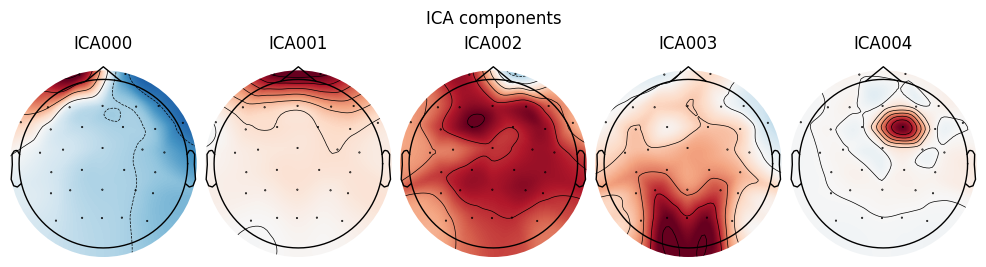

ICA applied to remove artifacts.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
EOG regression applied.
Applying ICA to Raw instance
    Transforming to ICA space (5 components)
    Zeroing out 0 ICA components
    Projecting back using 32 PCA components
ICA solution applied to obtain cleaned data.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 63 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 63.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 63.50 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Setting up low-pass filter at 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 213 samples (1.664 s)

Muscle artifacts annotated with z-score threshold=5.
Used Annotations descriptions: ['BAD_muscle']
Found 309 events from annotations.


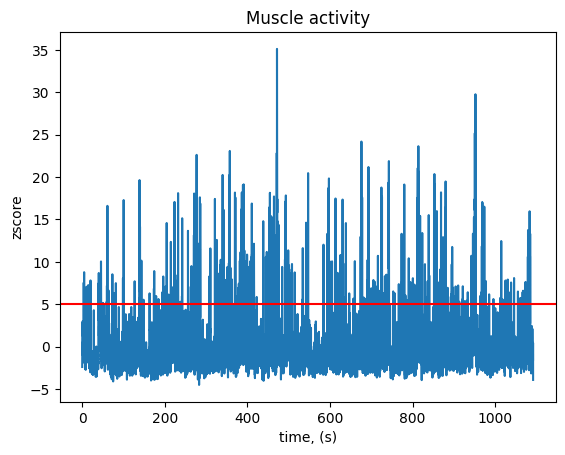

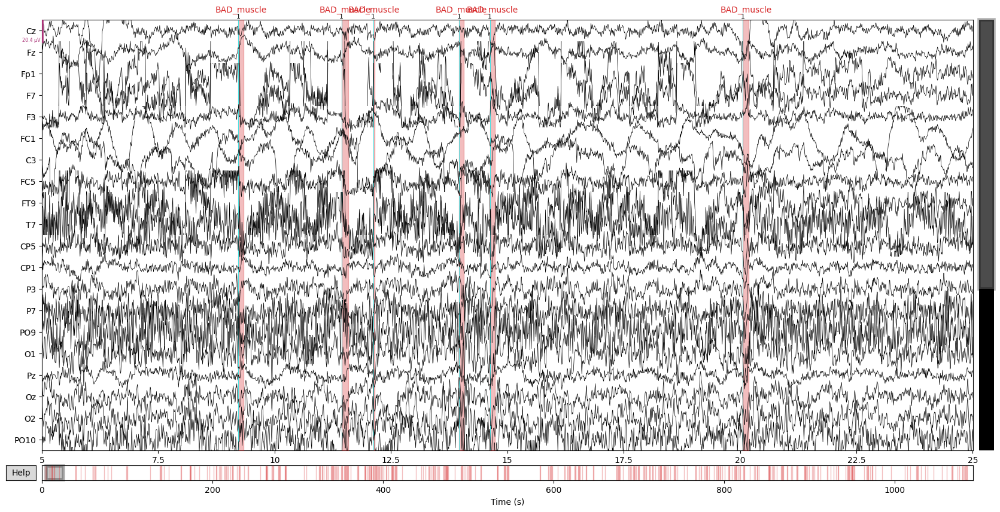

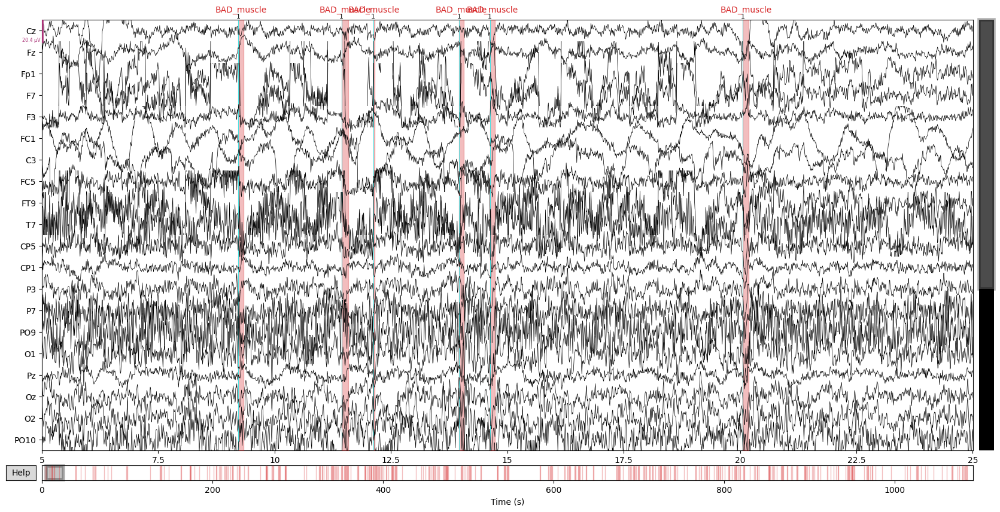

Plotted raw and cleaned EEG data with annotations and events.


In [8]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', preload=True, verbose=True, infer_types=True)
print(f"Raw data loaded. Number of channels: {len(raw.ch_names)}, Sampling frequency: {raw.info['sfreq']} Hz")

# Select EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
raw.pick_channels(eeg_channels)
print(f"Selected EEG channels: {eeg_channels}")

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
print("Standard 10-20 montage applied.")

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)
raw.filter(l_freq=1, h_freq=40)
print("Applied average reference and band-pass filter (1 - 40 Hz).")

# Apply ICA to remove artifacts
ica = mne.preprocessing.ICA(n_components=5, random_state=97, max_iter=800)
ica.fit(raw)
ica.plot_components()
print("ICA applied to remove artifacts.")

# EOG regression
eogRegression = mne.preprocessing.EOGRegression(picks_artifact='Fp1')
eogRegression.fit(raw)
eogCorrected = eogRegression.apply(raw.copy())
print("EOG regression applied.")

# Apply ICA solution to clean data
raw_clean = ica.apply(raw.copy())
print("ICA solution applied to obtain cleaned data.")

# Annotate muscle artifacts using z-score
threshold_muscle = 5  # z-score
annot_muscle, scores_muscle = mne.preprocessing.annotate_muscle_zscore(
    raw,
    ch_type="eeg",
    threshold=threshold_muscle,
    min_length_good=0.2,
    filter_freq=[1, 63],
)

fig, ax = plt.subplots()
ax.plot(raw.times, scores_muscle)
ax.axhline(y=threshold_muscle, color="r")
ax.set(xlabel="time, (s)", ylabel="zscore", title="Muscle activity")




# Convert segments to Annotations format
if annot_muscle is not None:
    raw.set_annotations(annot_muscle)
    raw_clean.set_annotations(annot_muscle)  # Apply the same annotations to cleaned data

    print(f"Muscle artifacts annotated with z-score threshold={threshold_muscle}.")

# Extract events from annotations
events_from_annot, event_dict = mne.events_from_annotations(raw, event_id=None, regexp=None, use_rounding=False)

# Print events found
print(f"Found {len(events_from_annot)} events from annotations.")

# Plot raw and cleaned data with annotations and events
order = np.arange(0, len(raw.ch_names))  # Replace with your valid channel indices
raw.plot(start=5, duration=20, order=order, title='Raw EEG Data with Annotations', scalings='auto', events=events_from_annot)
raw_clean.plot(start=5, duration=20, order=order, title='Cleaned EEG Data with Annotations', scalings='auto', events=events_from_annot)

plt.show()

print("Plotted raw and cleaned EEG data with annotations and events.")


In [9]:
dir(mne)

['AcqParserFIF',
 'Annotations',
 'BaseEpochs',
 'BiHemiLabel',
 'Covariance',
 'Dipole',
 'DipoleFixed',
 'Epochs',
 'EpochsArray',
 'Evoked',
 'EvokedArray',
 'Forward',
 'Info',
 'Label',
 'MixedSourceEstimate',
 'MixedVectorSourceEstimate',
 'Projection',
 'Report',
 'SourceEstimate',
 'SourceMorph',
 'SourceSpaces',
 'Transform',
 'VectorSourceEstimate',
 'VolSourceEstimate',
 'VolVectorSourceEstimate',
 'add_reference_channels',
 'add_source_space_distances',
 'annotations_from_events',
 'apply_forward',
 'apply_forward_raw',
 'average_forward_solutions',
 'beamformer',
 'channel_indices_by_type',
 'channel_type',
 'channels',
 'chpi',
 'combine_evoked',
 'commands',
 'compute_covariance',
 'compute_proj_epochs',
 'compute_proj_evoked',
 'compute_proj_raw',
 'compute_rank',
 'compute_raw_covariance',
 'compute_source_morph',
 'concatenate_epochs',
 'concatenate_events',
 'concatenate_raws',
 'convert_forward_solution',
 'coreg',
 'count_annotations',
 'count_events',
 'create_def

Extracting EDF parameters from e:\WEBSITE\EDF_analysis\EDF+\103918\103918.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
Raw data loaded. Number of channels: 127, Sampling frequency: 128.0 Hz
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Selected EEG channels: ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
Standard 10-20 montage applied.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 63.00 Hz
- Upper transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 63.50 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Setting up low-pass filter at 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 213 samples (1.664 s)

Merged events with replace=True:
[[134   0  12]
 [341   0  12]
 [502   0   3]]

Merged events with replace=False:
[[134   0  12]
 [134   0   1]
 [341   0  12]
 [341   0   2]
 [502   0   3]]
Muscle artifacts annotated with z-score threshold=5. Merged with video events.
Used Annotations descriptions: ['1', '12', '2', '3', 'BAD_muscle']


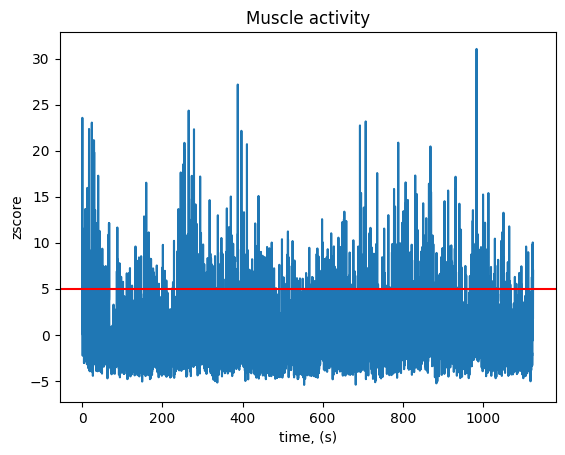

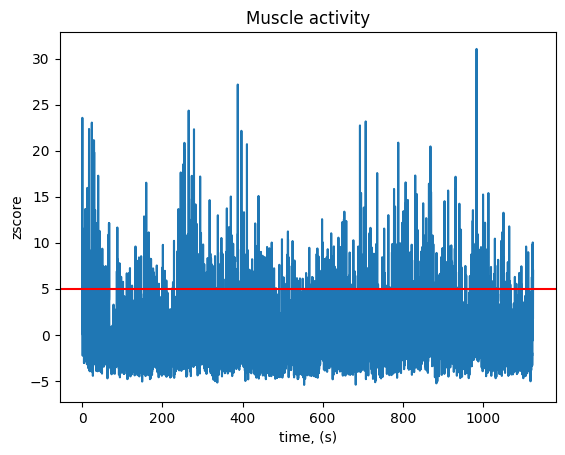

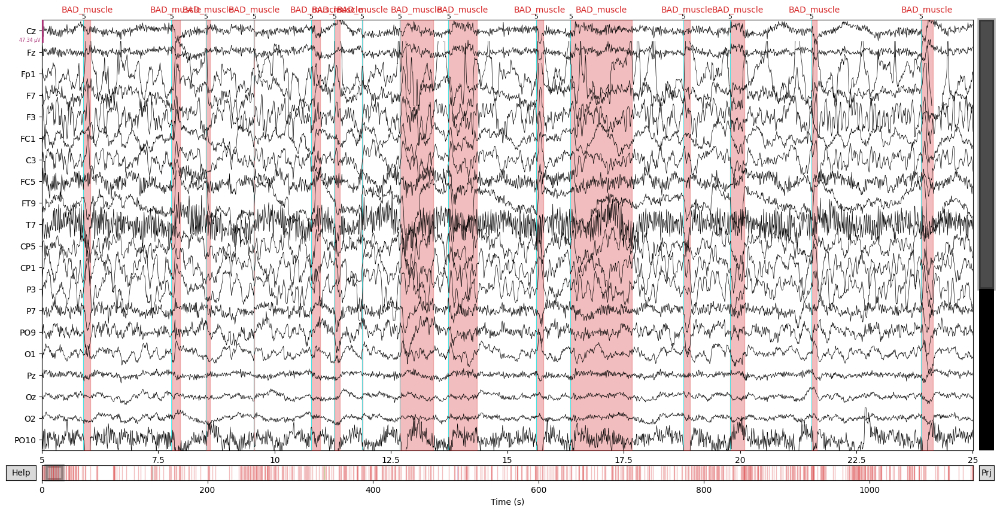

Plotted raw EEG data with annotations and events.


In [11]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\103918\103918.edf', preload=True)
print(f"Raw data loaded. Number of channels: {len(raw.ch_names)}, Sampling frequency: {raw.info['sfreq']} Hz")

# Select EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
raw.pick_channels(eeg_channels)
print(f"Selected EEG channels: {eeg_channels}")

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
print("Standard 10-20 montage applied.")

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)
raw.filter(l_freq=1, h_freq=40)
print("Applied average reference and band-pass filter (1 - 40 Hz).")

# Annotate muscle artifacts using z-score
threshold_muscle = 5  # z-score
annot_muscle, scores_muscle = mne.preprocessing.annotate_muscle_zscore(
    raw,
    ch_type="eeg",
    threshold=threshold_muscle,
    min_length_good=0.2,
    filter_freq=[1, 63],
)

# Print and plot muscle activity
fig, ax = plt.subplots()
ax.plot(raw.times, scores_muscle)
ax.axhline(y=threshold_muscle, color="r")
ax.set(xlabel="time, (s)", ylabel="zscore", title="Muscle activity")

# Define baseline period (0 to 30 seconds)
baseline_start = 0
baseline_end = 30
sfreq = raw.info['sfreq']  # Get the sampling frequency

# Extract baseline period
baseline_data, _ = raw[:, int(baseline_start * sfreq):int(baseline_end * sfreq)]

# Merge events function
def merge_events(events, event_indices, new_event_code, replace_events=True):
    """
    Merge specific events in the events array with a new event code.

    Parameters:
    events : list of lists
        List of events where each event is represented as [onset_sample, duration, event_code].
    event_indices : list
        List of indices indicating which events to merge with the new_event_code.
    new_event_code : int
        New event code to assign to merged events.
    replace_events : bool, optional
        If True, replace the original events with the merged events. If False,
        keep the original events and add merged events.

    Returns:
    merged_events : numpy.ndarray
        Array of merged events with the specified changes.
    """
    merged_events = []
    
    for event in events:
        onset_sample, duration, event_code = event
        
        if event_code in event_indices:
            if replace_events:
                event = [onset_sample, duration, new_event_code]
            else:
                merged_events.append([onset_sample, duration, new_event_code])
        
        merged_events.append(event)
    
    return np.array(merged_events)

# Example usage based on your provided examples:
events = [[134, 0, 1], [341, 0, 2], [502, 0, 3]]
merged_events_replace = merge_events(events, [1, 2], 12, replace_events=True)
merged_events_keep = merge_events(events, [1, 2], 12, replace_events=False)

print("Merged events with replace=True:")
print(merged_events_replace)

print("\nMerged events with replace=False:")
print(merged_events_keep)

# Merge muscle artifacts annotations with video events
if annot_muscle is not None:
    # Combine annotations with merged events
    combined_annotations = annot_muscle.copy()  # Create a copy of muscle annotations
    for event in merged_events_keep:
        onset_sample, duration, event_code = event
        combined_annotations.append(onset_sample, duration, description=str(event_code))

    raw.set_annotations(combined_annotations)
    print(f"Muscle artifacts annotated with z-score threshold={threshold_muscle}. Merged with video events.")

# Plot raw data with annotations
events_from_annot = mne.events_from_annotations(raw, event_id=None, regexp=None, use_rounding=False)[0]
order = np.arange(0, len(raw.ch_names))  # Replace with your valid channel indices
raw.plot(start=5, duration=20, order=order, title='Raw EEG Data with Annotations', scalings='auto', events=events_from_annot)

plt.show()

print("Plotted raw EEG data with annotations and events.")


Extracting EDF parameters from f:\WEBSITE\EDF_analysis\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
Raw data loaded. Number of channels: 127, Sampling frequency: 128.0 Hz
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Selected EEG channels: ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
Standard 10-20 montage applied.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Setting up low-pass filter at 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 213 samples (1.664 s)

Merged events with replace=True:
[[134   0  12]
 [341   0  12]
 [502   0   3]]

Merged events with replace=False:
[[134   0  12]
 [134   0   1]
 [341   0  12]
 [341   0   2]
 [502   0   3]]
Muscle artifacts annotated with z-score threshold=5. Merged with video events.
Used Annotations descriptions: [np.str_('1'), np.str_('12'), np.str_('2'), np.str_('3'), np.str_('BAD_muscle')]
Using matplotlib as 2D backend.


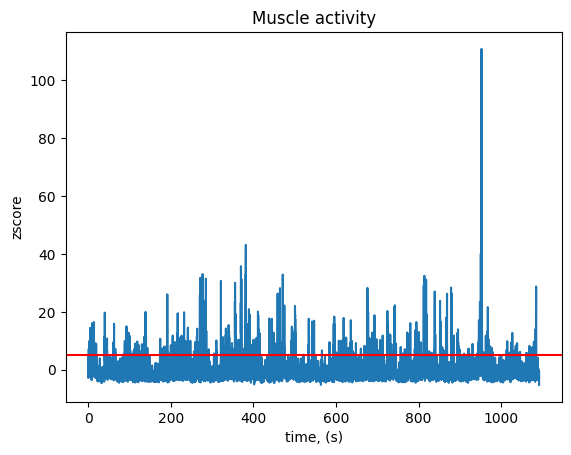

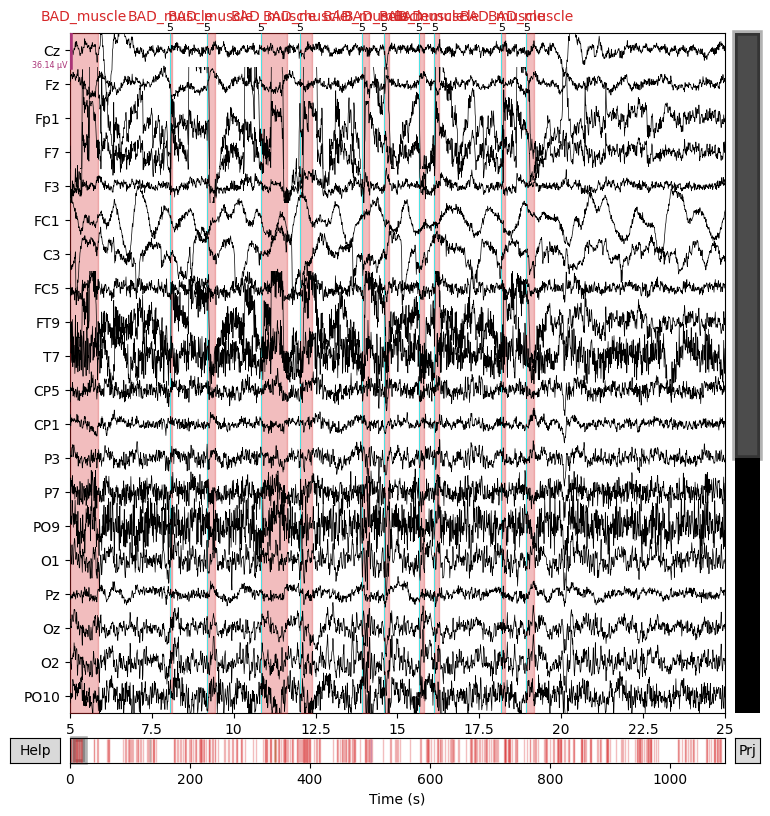

Plotted raw EEG data with annotations and events.


In [1]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', preload=True)
print(f"Raw data loaded. Number of channels: {len(raw.ch_names)}, Sampling frequency: {raw.info['sfreq']} Hz")

# Select EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
raw.pick_channels(eeg_channels)
print(f"Selected EEG channels: {eeg_channels}")

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
print("Standard 10-20 montage applied.")

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)
raw.filter(l_freq=1, h_freq=40)
print("Applied average reference and band-pass filter (1 - 40 Hz).")

# Annotate muscle artifacts using z-score
threshold_muscle = 5  # z-score
annot_muscle, scores_muscle = mne.preprocessing.annotate_muscle_zscore(
    raw,
    ch_type="eeg",
    threshold=threshold_muscle,
    min_length_good=0.2,
    filter_freq=[1, 63],
)

# Print and plot muscle activity
fig, ax = plt.subplots()
ax.plot(raw.times, scores_muscle)
ax.axhline(y=threshold_muscle, color="r")
ax.set(xlabel="time, (s)", ylabel="zscore", title="Muscle activity")

# Define baseline period (0 to 30 seconds)
baseline_start = 0
baseline_end = 30
sfreq = raw.info['sfreq']  # Get the sampling frequency

# Extract baseline period
baseline_data, _ = raw[:, int(baseline_start * sfreq):int(baseline_end * sfreq)]

# Merge events function
def merge_events(events, event_indices, new_event_code, replace_events=True):
    """
    Merge specific events in the events array with a new event code.

    Parameters:
    events : list of lists
        List of events where each event is represented as [onset_sample, duration, event_code].
    event_indices : list
        List of indices indicating which events to merge with the new_event_code.
    new_event_code : int
        New event code to assign to merged events.
    replace_events : bool, optional
        If True, replace the original events with the merged events. If False,
        keep the original events and add merged events.

    Returns:
    merged_events : numpy.ndarray
        Array of merged events with the specified changes.
    """
    merged_events = []
    
    for event in events:
        onset_sample, duration, event_code = event
        
        if event_code in event_indices:
            if replace_events:
                event = [onset_sample, duration, new_event_code]
            else:
                merged_events.append([onset_sample, duration, new_event_code])
        
        merged_events.append(event)
    
    return np.array(merged_events)

# Example usage based on your provided examples:
events = [[134, 0, 1], [341, 0, 2], [502, 0, 3]]
merged_events_replace = merge_events(events, [1, 2], 12, replace_events=True)
merged_events_keep = merge_events(events, [1, 2], 12, replace_events=False)

print("Merged events with replace=True:")
print(merged_events_replace)

print("\nMerged events with replace=False:")
print(merged_events_keep)

# Merge muscle artifacts annotations with video events
if annot_muscle is not None:
    # Combine annotations with merged events
    combined_annotations = annot_muscle.copy()  # Create a copy of muscle annotations
    for event in merged_events_keep:
        onset_sample, duration, event_code = event
        combined_annotations.append(onset_sample, duration, description=str(event_code))

    raw.set_annotations(combined_annotations)
    print(f"Muscle artifacts annotated with z-score threshold={threshold_muscle}. Merged with video events.")

# Plot raw data with annotations
events_from_annot = mne.events_from_annotations(raw, event_id=None, regexp=None, use_rounding=False)[0]
order = np.arange(0, len(raw.ch_names))  # Replace with your valid channel indices
raw.plot(start=5, duration=20, order=order, title='Raw EEG Data with Annotations', scalings='auto', events=events_from_annot)

plt.show()

print("Plotted raw EEG data with annotations and events.")


In [13]:
print(raw.info)

<Info | 10 non-empty values
 bads: []
 ch_names: Cz, Fz, Fp1, F7, F3, FC1, C3, FC5, FT9, T7, CP5, CP1, P3, P7, ...
 chs: 32 EEG
 custom_ref_applied: False
 dig: 35 items (3 Cardinal, 32 EEG)
 highpass: 1.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2024-04-17 10:05:24 UTC
 nchan: 32
 projs: Average EEG reference: off
 sfreq: 128.0 Hz
 subject_info: 3 items (dict)
>
